In [1]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import numpy.random as npr
import csv
import datetime

In [2]:
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
class LemmaTokenizer(object):
    def __init__(self):
        self.wnl = WordNetLemmatizer()
        self.nogoes = set([',', '...', '`', "'", '?', ';', ')', '(', "'s", "'m", 'u', "&", ':', "''", "``", "'ve", "'re", '--', '-','..' ])   
    def __call__(self, doc):
        pass1 = [self.wnl.lemmatize(t) for t in word_tokenize(doc)]
        pass2 = [t for t in pass1 if t not in self.nogoes]
        return pass2

In [3]:
def print_topics(model, vocab, top_k=10):
    topic_words = model.topic_word_
    for i, topic_dist in enumerate(topic_words):
        topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(top_k+1):-1]
        print('\tTopic {}: {}'.format(i+1, ', '.join(topic_words)))
        print
    print

In [3]:
from disclda.lda import DiscLDA
#model = DiscLDA(n_topics=n_topics, n_iter=1000, random_state=0)
#model.fit(X,y)

In [553]:
def run_disclda(d, l, n_topics=10, n_per=1, n_iter=1000, random_state=0):
    data = d
    labels = l
    print "Running LDA with %i topics and %i iterations..." % (n_topics, n_iter)
    cv = CountVectorizer('content', strip_accents='unicode', analyzer='word', stop_words='english', max_df=.9, min_df=2, ngram_range=(1,1))
    X = cv.fit_transform(d)
    vocab = [x[0] for x in sorted(cv.vocabulary_.items(), key=lambda x:x[1])]
    print "(N,V): ",X.shape
    print
    model = DiscLDA(n_topics=n_topics, n_per=n_per, n_iter=1000, random_state=0)
    model.fit(X, labels)
    results = {'n_topics':n_topics,
               'n_iter':n_iter,
               'vocab':vocab,
               'model':model,
               'X':X,
               'cv':cv
              }
    return results

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt

In [73]:
from foodbornenyc.models import models as m, documents as d, businesses as b, locations as l
db = m.getDBSession()

In [74]:
%%time
bigreviews = db.query(d.YelpReview).limit(50000).all()

CPU times: user 1.81 s, sys: 255 ms, total: 2.07 s
Wall time: 2.12 s


In [8]:
import logging
logging.getLogger("lda").setLevel(logging.ERROR)

### Fitting the $\Gamma$

In [9]:
import scipy.stats as st
def transform_doc(preprocess, model, doc):
    X = preprocess.transform([doc])
    #print X
    #print np.nonzero(X)
    return model.transform(X)

In [10]:
def empgamma(gvals, n=1):
    # compute empirical gamma params
    gbar = np.sum(gvals)/float(len(gvals))
    #print gbar
    gbar2 = gbar**2
    #print gbar2
    g2m = np.sum(gvals**2)/float(len(gvals))
    #print g2m

    # calculate shape estimate for gamma
    den = g2m - gbar2
    #print den
    bhat = gbar/den #bhat is the RATE parameter = 1/SCALE
    ahat = gbar2/den
    return st.gamma(n*ahat, scale=1./bhat)

## SELF TRAIN DISCLDA WITH 10000 UNLABELEDS

In [8]:
# pull in rows and sort them by date
rows = []
with open('data/reviews_foodborne_date_biz.csv') as f:
    for i, row in enumerate(csv.reader(f)):
        if i == 0 : continue
        row[1] = int(float(row[1]))
        row[2] = datetime.datetime.strptime(row[2], '%Y-%m-%d')
        rows.append(row)

# sort by date
rows = sorted(rows, key=lambda x:x[2], reverse=True)
            
# grab first 1000 by date
data = {'X':[], 'y':[]}
for i, row in enumerate(rows):
        data['X'].append(unicode(row[0], 'utf8'))
        data['y'].append(row[1])
        if i == 2999:
            break
data['y'] = np.array(data['y'])

# grab sceond 1000 by date
testdata = {'X':[], 'y':[]}
for i, row in enumerate(rows[3000:]):
        testdata['X'].append(row[0])
        testdata['y'].append(row[1])
        #if i == 1000:
        #    break
testdata['y'] = np.array(testdata['y'])

In [9]:
print 'Positives: ', len([y for y in data['y'] if y == 1])
print 'Negatives: ', len([y for y in data['y'] if y == 0])

Positives:  1713
Negatives:  1287


In [10]:
print 'Positives: ', len([y for y in testdata['y'] if y == 1])
print 'Negatives: ', len([y for y in testdata['y'] if y == 0])

Positives:  1114
Negatives:  1280


5
Running LDA with 5 topics and 1000 iterations...
(N,V):  (667, 3115)

Running LDA with 5 topics and 1000 iterations...
(N,V):  (667, 2995)

Running LDA with 5 topics and 1000 iterations...
(N,V):  (668, 3050)

AUC: 0.82
Running LDA with 5 topics and 1000 iterations...
(N,V):  (1001, 3915)

7
Running LDA with 7 topics and 1000 iterations...
(N,V):  (667, 3115)

Running LDA with 7 topics and 1000 iterations...
(N,V):  (667, 2995)

Running LDA with 7 topics and 1000 iterations...
(N,V):  (668, 3050)

AUC: 0.82
Running LDA with 7 topics and 1000 iterations...
(N,V):  (1001, 3915)

10
Running LDA with 10 topics and 1000 iterations...
(N,V):  (667, 3115)

Running LDA with 10 topics and 1000 iterations...
(N,V):  (667, 2995)

Running LDA with 10 topics and 1000 iterations...
(N,V):  (668, 3050)

AUC: 0.82
Running LDA with 10 topics and 1000 iterations...
(N,V):  (1001, 3915)

CPU times: user 3min 19s, sys: 421 ms, total: 3min 20s
Wall time: 3min 21s


Bestn 7


In [11]:
sample = [rev.text for rev in np.random.choice(bigreviews, 10000, replace=False)]

In [730]:
### THIS WAS A STUPID IDEA ANYWAYS
# %%time
# from copy import deepcopy
# unlabeled = np.array(sample)
# labeled = deepcopy(data['X'])
# labels = deepcopy(data['y'])
# i=0
# while not len(labeled) == len(unlabeled) and i < 2:
#     model = run_disclda(labeled, labels, n_topics=bestn, n_per=1, n_iter=100, random_state=0)
#     preds = [(doc, transform_doc(model['cv'], model['model'], doc)[0,1]) for doc in unlabeled]
#     preds.sort(key=lambda x:x[1])
#     labeled.append(preds[:100]) # negs on top
#     np.append(labels, np.zeros(100))
#     labeled.append(preds[-100:]) # pos on bottom
#     np.append(labels, np.ones(100))
#     unlabeled = preds[100:-100][1] # get rid of preds
#     i+=1
    

In [12]:
data['X'].extend(sample)
data['y'] = np.append(data['y'], np.ones(len(sample))*2)
print len(data['X'])
print data['y'].shape

13000
(13000,)


In [13]:
from sklearn import cross_validation
from sklearn.metrics import roc_curve, auc
folds = cross_validation.StratifiedKFold(data['y'], n_folds=3, random_state=0, shuffle=True)

In [777]:
# %%time
disc_models = []
for n_top in [5,10,20,30]:
    print n_top
    preds = []
    truths = []
    # get all the CV predictions
    for fold in folds:
        train_X, train_y = np.array(data['X'])[fold[0]], data['y'][fold[0]]
        test_X, test_y = np.array(data['X'])[fold[1]], data['y'][fold[1]]
        model = run_disclda(train_X, train_y, n_topics=n_top, n_per=1, n_iter=300, random_state=0)
        trainetas = model['model'].doc_topic_[:,1]
        testetas = np.array([transform_doc(model['cv'], model['model'], doc)[0,1] for doc in test_X])
        empgam = empgamma(trainetas) 
        testscores = empgam.cdf(testetas)
        preds.extend(list(testscores))
        test_y[np.where(test_y==2)] = 0
        truths.extend(list(test_y))
    # compute AUC over entire CV
    fpr, tpr, _ = roc_curve(truths, preds)
    s = auc(fpr, tpr)
    print "AUC: %.2f"% s
    # refit the model with whole train
    model = run_disclda(data['X'], data['y'], n_topics=n_top, n_per=1, n_iter=500, random_state=0)
    disc_models.append((model, s))

5
Running LDA with 5 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 5 topics and 300 iterations...
(N,V):  (8667, 13110)

Running LDA with 5 topics and 300 iterations...
(N,V):  (8667, 13073)

AUC: 0.94
Running LDA with 5 topics and 500 iterations...
(N,V):  (13000, 16004)

10
Running LDA with 10 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 10 topics and 300 iterations...
(N,V):  (8667, 13110)

Running LDA with 10 topics and 300 iterations...
(N,V):  (8667, 13073)

AUC: 0.95
Running LDA with 10 topics and 500 iterations...
(N,V):  (13000, 16004)

20
Running LDA with 20 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 20 topics and 300 iterations...
(N,V):  (8667, 13110)

Running LDA with 20 topics and 300 iterations...
(N,V):  (8667, 13073)

AUC: 0.95
Running LDA with 20 topics and 500 iterations...
(N,V):  (13000, 16004)

30
Running LDA with 30 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 30 topi

In [828]:
# take the best disclda
result_bias = sorted(disc_models, key=lambda x:x[1], reverse=True)[0][0]
bestn = result_bias['model'].n_topics
print "Bestn %i" % bestn

Bestn 20


In [779]:
# %%time
# result_bias = run_disclda(data['X'], data['y'], n_per=1, n_topics=30, n_iter=200, random_state=0)

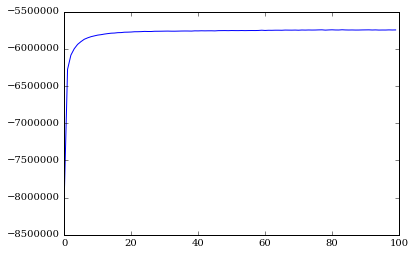

In [824]:
plt.plot( result_bias['model'].loglikelihoods_)
plt.savefig('semisup_disclda_fit.png')

In [829]:
thetas = result_bias['model'].doc_topic_
fitetas = thetas[:,1]
#print len(thetas[data['y'] == 0])
#print data['y']

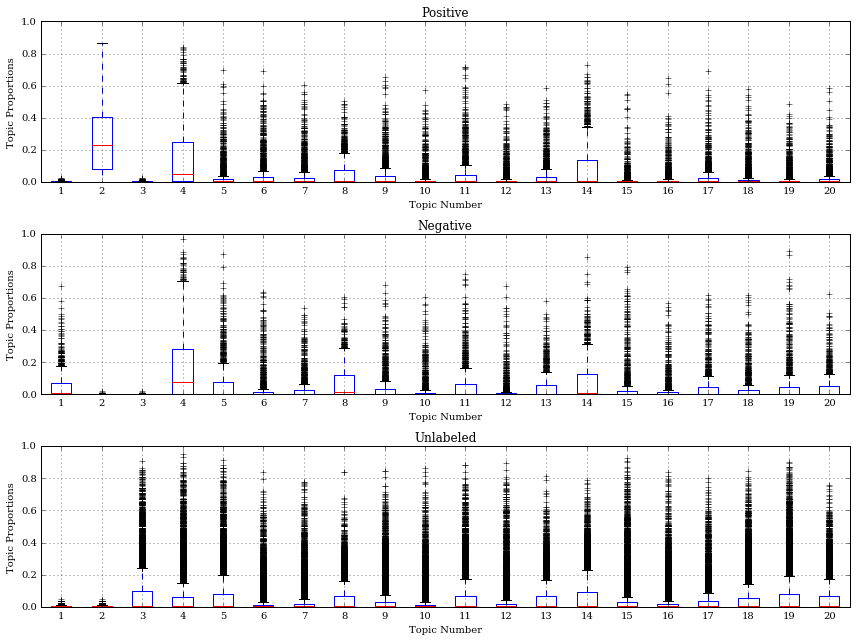

In [832]:
fig, (ax0, ax1, ax2) = plt.subplots(3,1, figsize=(12,9), sharey=True)
ax0.boxplot(thetas[np.where(data['y'] == 1)])
ax0.grid()
ax0.set_title("Positive")
ax0.set_xlabel("Topic Number")
ax0.set_ylabel("Topic Proportions")
ax1.boxplot(thetas[np.where(data['y'] == 0)])#np.random.randint(2500,10000,size=2500),:])
ax1.grid()
ax1.set_title("Negative")
ax1.set_xlabel("Topic Number")
ax1.set_ylabel("Topic Proportions")

ax2.boxplot(thetas[np.where(data['y'] == 2)])#np.random.randint(2500,10000,size=2500),:])
ax2.grid()
ax2.set_title("Unlabeled")
ax2.set_xlabel("Topic Number")
ax2.set_ylabel("Topic Proportions")

plt.tight_layout()
plt.savefig('semisup_disclda_train_dist.png')

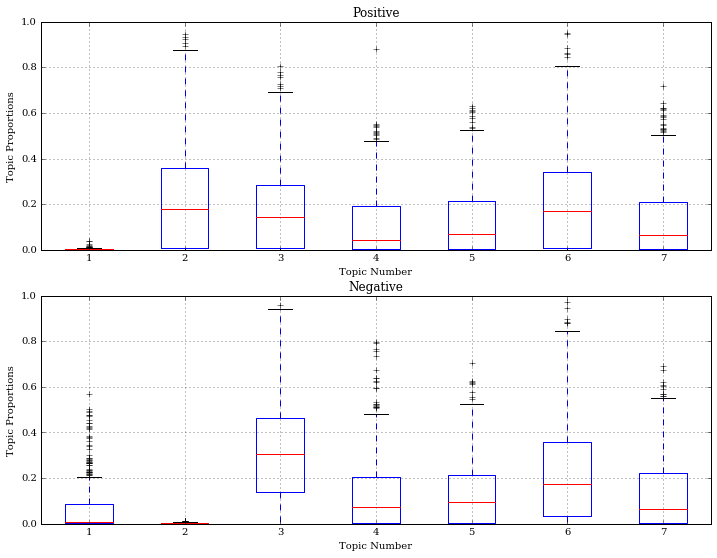

In [673]:
# fig, (ax0, ax1) = plt.subplots(2,1, figsize=(12,9), sharey=True)
# ax0.boxplot(thetas[np.where(data['y'] == 1)])
# ax0.grid()
# ax0.set_title("Positive")
# ax0.set_xlabel("Topic Number")
# ax0.set_ylabel("Topic Proportions")
# ax1.boxplot(thetas[np.where(data['y'] == 0)])#np.random.randint(2500,10000,size=2500),:])
# ax1.grid()
# ax1.set_title("Negative")
# ax1.set_xlabel("Topic Number")
# ax1.set_ylabel("Topic Proportions")

# plt.savefig('sup_train_classdist.pdf')

In [783]:
print_topics(result_bias['model'], result_bias['vocab'], top_k=50)

	Topic 1: sick, food, gluten, poisoning, raw, free, got, people, disgusting, felt, come, eating, eat, stomach, getting, horrible, like, toilet, husband, box, feel, health, really, chicken, tasted, thank, diarrhea, worst, use, day, literally, thing, doctor, ate, avoid, cold, makes, hope, days, issue, juice, meat, throw, outside, sickness, allergy, contamination, dirt, smell, cross

	Topic 2: food, poisoning, sick, got, day, night, eating, stomach, ate, place, hours, ordered, eat, went, diarrhea, bad, chicken, later, days, time, restaurant, worst, vomiting, home, bathroom, felt, terrible, ill, health, husband, don, friend, tasted, horrible, know, started, throwing, experience, sure, morning, meal, hour, dinner, gave, ve, disgusting, avoid, stay, case, away

	Topic 3: great, food, place, service, good, amazing, delicious, staff, friendly, atmosphere, definitely, nice, best, restaurant, excellent, love, dinner, recommend, really, wine, spot, perfect, menu, awesome, try, highly, time, decor

0 -2.15239548649
1 16.5810598815
2 -2.06791316646
3 1.12848766396
4 -2.29568019904
5 -1.44830613976
6 -0.945404199255
7 0.424055535733
8 -0.189466150428
9 -0.705092728948
10 -0.85683053883
11 -1.3732806948
12 -0.653263131414
13 -1.19083628478
14 -2.45901498408
15 -1.84411996441
16 -0.575541207867
17 3.46511846973
18 -2.87494036561
19 0.64322814304
20 -2.03419095445
21 -0.43277408724
22 1.72106759709
23 1.13121089813
24 -0.786443979364
25 -1.20053919287
26 -0.0600819920645
27 0.393020445261
28 -0.952138734146
29 -2.60829187847

In [784]:
testthetas = np.array([transform_doc(result_bias['cv'], result_bias['model'], doc)[0,:] for doc in testdata['X']])

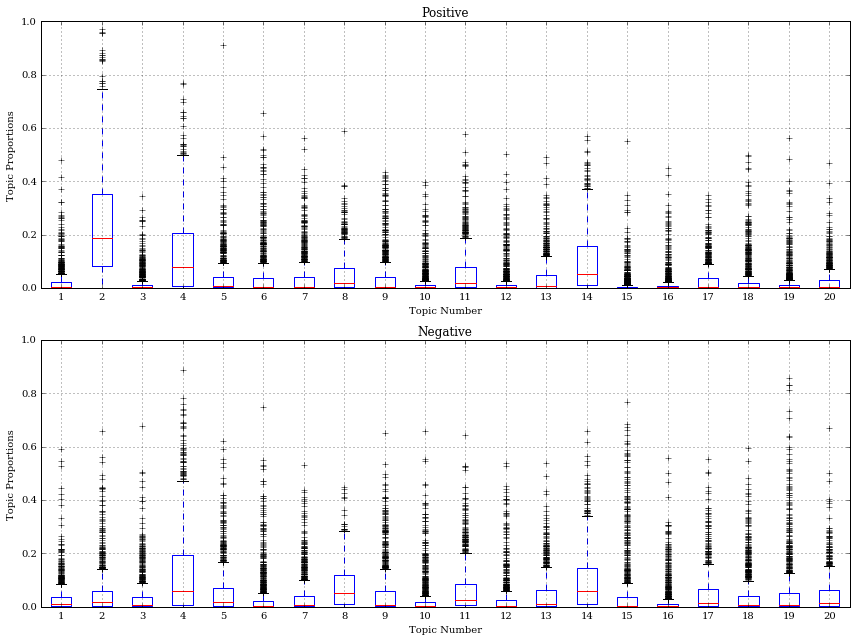

In [833]:
fig, (ax0, ax1) = plt.subplots(2,1, figsize=(12,9), sharey=True)
ax0.boxplot(testthetas[np.where(testdata['y'] == 1)])
ax0.grid()
ax0.set_title("Positive")
ax0.set_xlabel("Topic Number")
ax0.set_ylabel("Topic Proportions")
ax1.boxplot(testthetas[np.where(testdata['y'] == 0)])#np.random.randint(2500,10000,size=2500),:])
ax1.grid()
ax1.set_title("Negative")
ax1.set_xlabel("Topic Number")
ax1.set_ylabel("Topic Proportions")

plt.tight_layout()
plt.savefig('semisup_test_topicdist.png')

In [806]:
testlabels = testdata['y']
testscores = testthetas[:,1]
print testlabels.shape, testscores.shape
#convert them to gamma probs
#print thetas
testgamma = empgamma(thetas[:,1]) 
testscores = testgamma.cdf(testscores)
#print testscores

(2394,) (2394,)


In [787]:
from sklearn.metrics import roc_curve, auc
# define baseline pipelines
from sklearn.linear_model import LogisticRegression
from sklearn import svm


In [788]:
data['y'][np.where(data['y']==2)] = 0

### Vailla LDA w/o oversampling

In [790]:
%%time
lda_models = []
for n_top in [5, 10, 20, 30]:
    print n_top
    preds = []
    truths = []
#     get all the CV predictions
    for fold in folds:
        train_X, train_y = np.array(data['X'])[fold[0]], data['y'][fold[0]]
        test_X, test_y = np.array(data['X'])[fold[1]], data['y'][fold[1]]
        model = run_disclda(train_X, train_y, n_topics=n_top, n_per=0, n_iter=300, random_state=0)
        trainetas = model['model'].doc_topic_[:,1]
        testetas = np.array([transform_doc(model['cv'], model['model'], doc)[0,1] for doc in test_X])
        empgam = empgamma(trainetas) 
        testscores = empgam.cdf(testetas)
        preds.extend(list(testscores))
        truths.extend(list(test_y))
    # compute AUC over entire CV
    fpr, tpr, _ = roc_curve(truths, preds)
    s = auc(fpr, tpr)
    print "AUC: %.2f"% s
    # refit the model with whole train
    model = run_disclda(data['X'], data['y'], n_topics=n_top, n_per=0, n_iter=500, random_state=0)
    lda_models.append((model, s))

5
Running LDA with 5 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 5 topics and 300 iterations...
(N,V):  (8667, 13110)

Running LDA with 5 topics and 300 iterations...
(N,V):  (8667, 13073)

AUC: 0.28
Running LDA with 5 topics and 500 iterations...
(N,V):  (13000, 16004)

10
Running LDA with 10 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 10 topics and 300 iterations...
(N,V):  (8667, 13110)

Running LDA with 10 topics and 300 iterations...
(N,V):  (8667, 13073)

AUC: 0.44
Running LDA with 10 topics and 500 iterations...
(N,V):  (13000, 16004)

20
Running LDA with 20 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 20 topics and 300 iterations...
(N,V):  (8667, 13110)

Running LDA with 20 topics and 300 iterations...
(N,V):  (8667, 13073)

AUC: 0.46
Running LDA with 20 topics and 500 iterations...
(N,V):  (13000, 16004)

30
Running LDA with 30 topics and 300 iterations...
(N,V):  (8666, 12924)

Running LDA with 30 topi

In [791]:
bestlda =sorted(lda_models, key=lambda x:x[1], reverse=True)[0][0]
bestln = bestlda['model'].n_topics
print "Bestn %i" % bestn

Bestn 20


### Logistic Regression

In [14]:
data['y'][np.where(data['y']==2)] = 0

In [16]:
from sklearn.linear_model import LogisticRegression

In [21]:
# %%time
#cross validate a logreg
logreg_models = []
for C in [.05, .1, .5, 1.]:
    for ngram in [1,2,3]:
        print C, ngram
        preds = []
        truths = []
        # get all the CV predictions
        for fold in folds:
            train_X, train_y = np.array(data['X'])[fold[0]], data['y'][fold[0]]
            test_X, test_y = np.array(data['X'])[fold[1]], data['y'][fold[1]]
            lr = LogisticRegression(C=C,
                            fit_intercept=True,
                            random_state=0,
                            class_weight='balanced',
                            n_jobs=-1)
            cv = CountVectorizer('content', strip_accents='unicode', analyzer='word', stop_words='english', 
                                 max_df=.9, min_df=2, ngram_range=(1,ngram))
            trainX = cv.fit_transform(train_X)
            lr.fit(trainX, train_y)
            testX = cv.transform(test_X)
            lrscores = lr.predict_proba(testX)[:,1]
            preds.extend(list(lrscores))
            truths.extend(list(test_y))
        # compute AUC over entire CV
        fpr, tpr, _ = roc_curve(truths, preds)
        s = auc(fpr, tpr)
        print "AUC: %.2f"% s
        # refit the model on whole train
        lr = LogisticRegression(C=C,
                            fit_intercept=True,
                            random_state=0,
                            n_jobs=-1) 
        cv = CountVectorizer('content', strip_accents='unicode', analyzer='word', stop_words='english', 
                             max_df=.9, min_df=2, ngram_range=(1,ngram))
        X = cv.fit_transform(data['X'])
        lr.fit(X, data['y']) 
        logreg_models.append((lr, s))
print "DONE"

0.05 1
AUC: 0.97
0.05 2
AUC: 0.97
0.05 3
AUC: 0.97
0.1 1
AUC: 0.97
0.1 2
AUC: 0.97
0.1 3
AUC: 0.97
0.5 1
AUC: 0.96
0.5 2
AUC: 0.97
0.5 3
AUC: 0.97
1.0 1
AUC: 0.96
1.0 2
AUC: 0.97
1.0 3
AUC: 0.97
DONE


In [47]:

from sklearn.pipeline import Pipeline

# Feature Extractors
cv = CountVectorizer(
        input=u'content', 
        encoding=u'utf-8', 
        decode_error=u'strict', 
        strip_accents='unicode', 
        lowercase=True,
        analyzer=u'word', 
        preprocessor=None, 
        tokenizer=None, 
        stop_words='english', 
        #token_pattern=u'(?u)\\b\w\w+\b', # one alphanumeric is a token
        ngram_range=(1, 2), 
        max_df=.9, 
        min_df=2, 
        max_features=None, 
        vocabulary=None, 
        binary=False, 
        #dtype=type 'numpy.int64'>
        )
from sklearn.feature_extraction.text import TfidfTransformer
tf = TfidfTransformer(
        norm='l2',
        use_idf=True,
        smooth_idf=True,
        sublinear_tf=False
)

# Final Classifier
from sklearn.naive_bayes import MultinomialNB
lr = LogisticRegression(C=.05,
                        fit_intercept=True,
                        random_state=0,
                        class_weight='balanced',
                        n_jobs=-1)

pipeline = Pipeline([
    ('count', cv),
    ('tfidf', tf),
    ('logreg', lr)
    ])

param_grid = {
    'count__ngram_range':[(1,1),(1,2),(1,3)],
    'tfidf__norm':['l1', 'l2'],
    'tfidf__use_idf':[True, False],
    'tfidf__sublinear_tf':[True,False],
    'logreg__C':[.001, .01, .1]
}

In [48]:
from sklearn.grid_search import GridSearchCV
grid_search = GridSearchCV(pipeline, 
                           param_grid,
                           cv = folds,
                           n_jobs=-1, verbose=1)

In [49]:
grid_search.fit(np.array(data['X']), data['y'])
print()

print("Best score: %0.3f" % grid_search.best_score_)
print("Best parameters set:")
best_parameters = grid_search.best_estimator_.get_params()
for param_name in sorted(param_grid.keys()):
    print("\t%s: %r" % (param_name, best_parameters[param_name]))

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   41.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  5.3min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:  6.3min finished


()
Best score: 0.940
Best parameters set:
	count__ngram_range: (1, 3)
	logreg__C: 0.01
	tfidf__norm: 'l2'
	tfidf__sublinear_tf: True
	tfidf__use_idf: True


(array([  1.,   4.,   2.,   3.,   3.,   6.,   9.,   8.,  13.,  23.]),
 array([ 0.82607692,  0.83748462,  0.84889231,  0.8603    ,  0.87170769,
         0.88311538,  0.89452308,  0.90593077,  0.91733846,  0.92874615,
         0.94015385]),
 <a list of 10 Patch objects>)

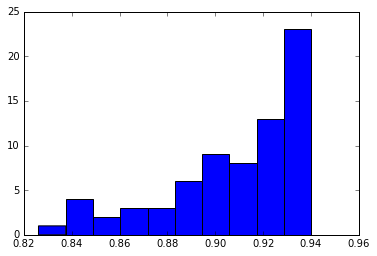

In [69]:
scores = [s.mean_validation_score for s in grid_search.grid_scores_]
plt.hist(scores)
# for s in grid_search.grid_scores_:
#     print s.mean_validation_score

In [72]:
# output the best one
from sklearn.externals import joblib
from foodbornenyc.settings import yelp_classifier_config as config
joblib.dump(grid_search.best_estimator_, '../'+config['model_file']) 

['../foodbornenyc/pipelines/models/yelp_sick_logreg.pkl',
 '../foodbornenyc/pipelines/models/yelp_sick_logreg.pkl_01.npy',
 '../foodbornenyc/pipelines/models/yelp_sick_logreg.pkl_02.npy',
 '../foodbornenyc/pipelines/models/yelp_sick_logreg.pkl_03.npy',
 '../foodbornenyc/pipelines/models/yelp_sick_logreg.pkl_04.npy',
 '../foodbornenyc/pipelines/models/yelp_sick_logreg.pkl_05.npy',
 '../foodbornenyc/pipelines/models/yelp_sick_logreg.pkl_06.npy']

### Logistic Regression using DiscLDA as input

In [794]:
%%time
transdata = [transform_doc(result_bias['cv'], result_bias['model'], doc) for doc in data['X']]
transtdata = [transform_doc(result_bias['cv'], result_bias['model'], doc) for doc in testdata['X']]

CPU times: user 29.2 s, sys: 63.3 ms, total: 29.3 s
Wall time: 32.4 s


In [795]:
print np.array(transdata).shape

(13000, 1, 20)


In [796]:
transdata = np.array(transdata).reshape(len(data['y']),bestn)#21001,30)
transtdata = np.array(transtdata).reshape(len(testdata['y']),bestn)
# print np.array(transtdata).shape

In [797]:
#cross validate a logreg fit with disclda inputs
translr_models = []
for C in [.01, .05, .1, .5, 1., 2.,5., 7., 10., 15., 20.]:
    print C
    preds = []
    truths = []
    # get all the CV predictions
    for fold in folds:
        train_X, train_y = transdata[fold[0],:], data['y'][fold[0]]
        test_X, test_y = transdata[fold[1],:], data['y'][fold[1]]
        lr = LogisticRegression(C=C,
                        fit_intercept=True,
                        random_state=0,
                        n_jobs=2)
#         cv = CountVectorizer('content', strip_accents='unicode', analyzer='word', stop_words='english', max_df=.9, min_df=2, ngram_range=(1,1))
#         trainX = cv.fit_transform(train_X)
        lr.fit(train_X, train_y)
#         testX = cv.transform(test_X)
        lrscores = lr.predict_proba(test_X)[:,1]
        preds.extend(list(lrscores))
        truths.extend(list(test_y))
    # compute AUC over entire CV
    fpr, tpr, _ = roc_curve(truths, preds)
    s = auc(fpr, tpr)
    print "AUC: %.2f"% s
    # refit the model on whole train
    lr = LogisticRegression(C=C,
                        fit_intercept=True,
                        random_state=0,
                        n_jobs=2) 
#     cv = CountVectorizer('content', strip_accents='unicode', analyzer='word', stop_words='english', max_df=.9, min_df=2, ngram_range=(1,1))
#     X = cv.fit_transform(data['X'])
    lr.fit(transdata, data['y']) 
    translr_models.append((lr, s))

0.01
AUC: 0.96
0.05
AUC: 0.96
0.1
AUC: 0.96
0.5
AUC: 0.96
1.0
AUC: 0.96
2.0
AUC: 0.96
5.0
AUC: 0.96
7.0
AUC: 0.96
10.0
AUC: 0.96
15.0
AUC: 0.96
20.0
AUC: 0.96


### Logistic Regression with Vanilla LDA

In [798]:
%%time
ldatransdata = [transform_doc(bestlda['cv'], bestlda['model'], doc) for doc in data['X']]
ldatranstdata = [transform_doc(bestlda['cv'], bestlda['model'], doc) for doc in testdata['X']]

CPU times: user 28.9 s, sys: 61.7 ms, total: 28.9 s
Wall time: 30.7 s


In [799]:
ldatransdata = np.array(ldatransdata).reshape(len(data['y']), bestln)#21001,bestln)
ldatranstdata = np.array(ldatranstdata).reshape(len(testdata['y']),bestln)

In [800]:
#cross validate a logreg fit with disclda input
ldalr_models = []
for C in [.01, .05, .1, .5, 1., 2.,5.]:
    print C
    preds = []
    truths = []
    # get all the CV predictions
    for fold in folds:
        train_X, train_y = ldatransdata[fold[0],:], data['y'][fold[0]]
        test_X, test_y = ldatransdata[fold[1],:], data['y'][fold[1]]
        lr = LogisticRegression(C=C,
                        fit_intercept=True,
                        random_state=0,
                        n_jobs=2)
#         cv = CountVectorizer('content', strip_accents='unicode', analyzer='word', stop_words='english', max_df=.9, min_df=2, ngram_range=(1,1))
#         trainX = cv.fit_transform(train_X)
        lr.fit(train_X, train_y)
#         testX = cv.transform(test_X)
        lrscores = lr.predict_proba(test_X)[:,1]
        preds.extend(list(lrscores))
        truths.extend(list(test_y))
    # compute AUC over entire CV
    fpr, tpr, _ = roc_curve(truths, preds)
    s = auc(fpr, tpr)
    print "AUC: %.2f"% s
    # refit the model on whole train
    lr = LogisticRegression(C=C,
                        fit_intercept=True,
                        random_state=0,
                        n_jobs=2) 
#     cv = CountVectorizer('content', strip_accents='unicode', analyzer='word', stop_words='english', max_df=.9, min_df=2, ngram_range=(1,1))
#     X = cv.fit_transform(data['X'])
    lr.fit(ldatransdata, data['y']) 
    ldalr_models.append((lr, s))

0.01
AUC: 0.96
0.05
AUC: 0.96
0.1
AUC: 0.96
0.5
AUC: 0.96
1.0
AUC: 0.96
2.0
AUC: 0.96
5.0
AUC: 0.96


In [801]:
# define baseline pipelines
from sklearn.linear_model import LogisticRegression
from sklearn import svm

# lr = LogisticRegression(C=1.0,
#                         fit_intercept=True,
#                         random_state=0,
#                         n_jobs=2)
#sv = svm.SVC( C=1.0,
#              kernel='linear')
#svr = svm.SVC( C=1.0,
#              kernel='rbf')

In [802]:
# lr.fit(result_bias['X'], data['y'])
#sv.fit(result_bias['X'], data['y'])
#svr.fit(result_bias['X'], data['y'])

### Evaluation of Test ROC on Individual Reviews

In [835]:
# take best LOGREG from CV
lr = sorted(logreg_models, key=lambda x:x[1], reverse=True)[0][0]
dlr = sorted(translr_models, key=lambda x:x[1], reverse=True)[0][0] 
ldalr = sorted(ldalr_models, key=lambda x:x[1], reverse=True)[0][0] 

In [836]:
testX = result_bias['cv'].transform(testdata['X'])
lrscores = lr.predict_proba(testX)[:,1]
dlrscores = dlr.predict_proba(transtdata)[:,1]
ldalrscores = ldalr.predict_proba(ldatranstdata)[:,1]
#svscores = sv.decision_function(testX)[:]
#svrscores = svr.decision_function(testX)[:]

In [837]:
fpr, tpr, dthresh = roc_curve(testlabels, testscores)
s = auc(fpr, tpr)
print dthresh[:10], dthresh[-10:]

[ 0.99779744  0.99295511  0.99289073  0.98972855  0.98958898  0.9888351
  0.9888248   0.98631887  0.98630015  0.9854978 ] [ 0.61360458  0.60402903  0.60377461  0.5649892   0.56466312  0.54845224
  0.54815056  0.48556143  0.47980286  0.33367933]


In [838]:
lrfpr, lrtpr, lrthresh = roc_curve(testlabels, lrscores)
lrs = auc(lrfpr, lrtpr)
dlrfpr, dlrtpr, dlrthresh = roc_curve(testlabels, dlrscores)
dlrs = auc(dlrfpr, dlrtpr)
ldalrfpr, ldalrtpr, ldalrthresh = roc_curve(testlabels, ldalrscores)
ldalrs = auc(ldalrfpr, ldalrtpr)
# svfpr, svtpr, _ = roc_curve(testlabels, svscores)
# svs = auc(svfpr, svtpr)
# svrfpr, svrtpr, _ = roc_curve(testlabels, svrscores)
# svrs = auc(svrfpr, svrtpr)

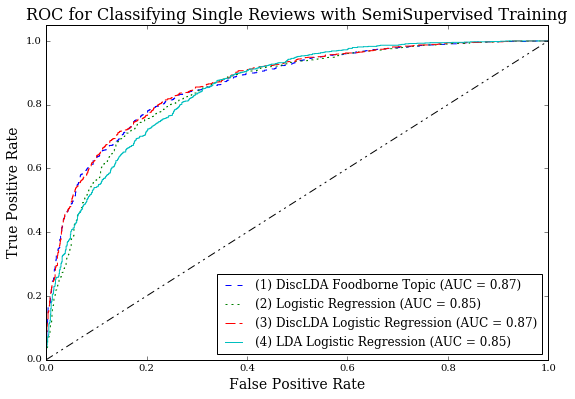

In [841]:
plt.figure(figsize=(9,6))
plt.rc('font', family='serif')
plt.plot(fpr, tpr, 'b--', label=r'(1) DiscLDA Foodborne Topic (AUC = %0.2f)' % s)
plt.plot(lrfpr, lrtpr, 'g-', dashes=[2,4], label='(2) Logistic Regression (AUC = %0.2f)'% lrs)
plt.plot(dlrfpr, dlrtpr, 'r-', dashes=[10,4], label='(3) DiscLDA Logistic Regression (AUC = %0.2f)'% dlrs)

plt.plot(ldalrfpr, ldalrtpr, 'c-', label='(4) LDA Logistic Regression (AUC = %0.2f)'% ldalrs)

# plt.plot(np.linspace(0,1, len(dthresh)),dthresh,'--', label="DiscLDA Thresh")
# plt.plot(np.linspace(0,1, len(lrthresh)),lrthresh,'--', label="LogReg Thrsh")
# plt.plot(np.linspace(0,1, len(dlrthresh)),dlrthresh,'--', label="DiscLogReg Thresh")
# plt.plot(np.linspace(0,1, len(ldalrthresh)),ldalrthresh,'--', label="LDALogReg Thresh")

#plt.plot(svfpr, svtpr, label='SVM (area = %0.2f)'% svs)
#plt.plot(svrfpr, svrtpr, label='SVM RBF (area = %0.2f)'% svrs)


plt.plot([0, 1], [0, 1],  'k-', dashes=[8, 4, 2, 4, 2, 4])
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC for Classifying Single Reviews with SemiSupervised Training', fontsize=16)
plt.legend(loc="lower right")
plt.savefig('semisupervised_single_roc.png')

### Training and Test Distributions
Note: For displaying Train distribution, take random sample from negative label since it heavily outweighs pos

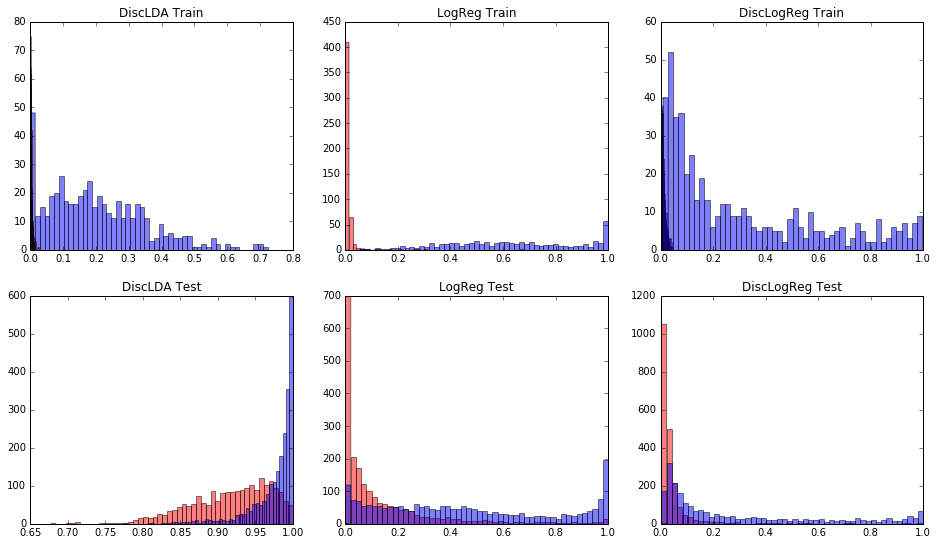

In [368]:
# plot the histograms of the values for each
# normalize decision function scores
norm_svscores = (1./(max(svscores)-min(svscores)))*(svscores - min(svscores))
norm_svrscores = (1./(max(svrscores)-min(svrscores)))*(svrscores - min(svrscores))

fig, axarr = plt.subplots(2,3, figsize=(16,9))
### TRAIN DISTRIBUTIONS
trainPos = thetas[np.where(data['y'] == 1)][:,1]
axarr[0,0].hist(trainPos, 50, alpha=.5, color='b')
axarr[0,0].hist(npr.choice(thetas[np.where(data['y'] == 0)][:,1], len(trainPos), replace=False), 50, alpha=.5, color='r')
axarr[0,0].set_title("DiscLDA Train")

# axarr[0,1].hist(lrscores)
axarr[0,1].hist(npr.choice(lr.predict_proba(result_bias['X'][np.where(data['y'] == 0)])[:,1], len(trainPos), replace=False), 50, alpha=.5, color='r')
axarr[0,1].hist(lr.predict_proba(result_bias['X'][np.where(data['y'] == 1)])[:,1], 50, alpha=.5, color='b')
axarr[0,1].set_title("LogReg Train")

axarr[0,2].hist(npr.choice(dlr.predict_proba(thetas[np.where(data['y'] == 0)])[:,1], len(trainPos), replace=False), 50, alpha=.5, color='r')
axarr[0,2].hist(dlr.predict_proba(thetas[np.where(data['y'] == 1)])[:,1], 50, alpha=.5, color='b')
axarr[0,2].set_title("DiscLogReg Train")

### TEST DISTRIBUTIONS
axarr[1,0].hist(testscores[np.where(testlabels ==0)], 50, alpha=.5, color='r')
axarr[1,0].hist(testscores[np.where(testlabels ==1)], 50, alpha=.5, color='b')
axarr[1,0].set_title("DiscLDA Test")

# axarr[0,1].hist(lrscores)
axarr[1,1].hist(lrscores[np.where(testlabels ==0)], 50, alpha=.5, color='r')
axarr[1,1].hist(lrscores[np.where(testlabels ==1)], 50, alpha=.5, color='b')
axarr[1,1].set_title("LogReg Test")

axarr[1,2].hist(dlrscores[np.where(testlabels ==0)], 50, alpha=.5, color='r')
axarr[1,2].hist(dlrscores[np.where(testlabels ==1)], 50, alpha=.5, color='b')
axarr[1,2].set_title("DiscLogReg Test")

# axarr[1,0].hist(norm_svscores)
# axarr[1,0].hist([s for s in norm_svscores[np.where(testlabels ==1)]], 50, alpha=.5, color='r')
# axarr[1,0].hist([s for s in norm_svscores[np.where(testlabels ==0)]], 50, alpha=.5, color='b')

# # axarr[1,1].hist(norm_svrscores)
# axarr[1,1].hist([s for s in norm_svrscores[np.where(testlabels ==1)]], 50, alpha=.5, color='r')
# axarr[1,1].hist([s for s in norm_svrscores[np.where(testlabels ==0)]], 50, alpha=.5, color='b')

## Experiment 2 Testing DiscLDA accuracy for individual review classification for unlabeleds

In [46]:
# what happens when I add some unlabeleds for context

In [47]:
# # pull in rows and sort them by date
# rows = []
# with open('reviews_foodborne_date_biz.csv') as f:
#     for i, row in enumerate(csv.reader(f)):
#         if i == 0 : continue
#         row[1] = int(float(row[1]))
#         row[2] = datetime.datetime.strptime(row[2], '%Y-%m-%d')
#         rows.append(row)

# # sort by date
# rows = sorted(rows, key=lambda x:x[2], reverse=True)
            
# # grab first 1000 by date
# data = {'X':[], 'y':[]}
# for i, row in enumerate(rows):
#         data['X'].append(row[0])
#         data['y'].append(row[1])
#         if i == 1000:
#             break
# data['y'] = np.array(data['y'])

# # grab sceond 1000 by date
# testdata = {'X':[], 'y':[]}
# for i, row in enumerate(rows[1001:2001]):
#         testdata['X'].append(row[0])
#         testdata['y'].append(row[1])
#         if i == 1000:
#             break
# testdata['y'] = np.array(testdata['y'])
# print data['y'].shape

In [48]:
# # supplement negative with a bunch of unlabeled
# n_extra = 10000
# unlabeled = [ t.text for t in np.random.choice(bigreviews, n_extra, replace=False)]
# data['X'].extend(unlabeled)
# data['y'] = np.append(data['y'],np.zeros(len(unlabeled)))

In [49]:
# result_bias = run_disclda(data['X'], data['y'], n_topics=10, n_iter=500)#run_disclda(data, labels, n_topics=10, n_per=1, n_iter=1000, random_state=0)

In [50]:
# plt.plot(result_bias['model'].loglikelihoods_)

In [51]:
# thetas = result_bias['model'].doc_topic_
# fitthetas=thetas
# #print len(thetas[data['y'] == 0])
# #print data['y']

In [52]:
### THE EMPIRICALLY FIT GAMMA

In [53]:
# fig, (ax0, ax1) = plt.subplots(2,1, figsize=(12,9), sharey=True)
# ax0.boxplot(thetas[np.where(data['y'] == 1)])
# ax0.grid()
# ax0.set_title("Positive")
# ax0.set_xlabel("Topic Number")
# ax0.set_ylabel("Topic Proportions")
# ax1.boxplot(thetas[np.where(data['y'] == 0)])#np.random.randint(2500,10000,size=2500),:])
# ax1.grid()
# ax1.set_title("Negative")
# ax1.set_xlabel("Topic Number")

# plt.tight_layout()
# #plt.savefig('lda_boxplot_2500_7500.pdf')

In [54]:
# print_topics(result_bias['model'], result_bias['vocab'], top_k=20)

In [55]:
# testthetas = np.array([transform_doc(result_bias['cv'], result_bias['model'], doc)[0,:] for doc in testdata['X']])

In [56]:
# fig, (ax0, ax1) = plt.subplots(2,1, figsize=(12,9), sharey=True)
# ax0.boxplot(testthetas[np.where(testdata['y'] == 1)])
# ax0.grid()
# ax0.set_title("Positive")
# ax0.set_xlabel("Topic Number")
# ax0.set_ylabel("Topic Proportions")
# ax1.boxplot(testthetas[np.where(testdata['y'] == 0)])#np.random.randint(2500,10000,size=2500),:])
# ax1.grid()
# ax1.set_title("Negative")
# ax1.set_xlabel("Topic Number")

# plt.tight_layout()

In [57]:
# testlabels = testdata['y']
# testscores = testthetas[:,1]

# #convert them to gamma probs
# #print thetas
# testgamma = empgamma(thetas[:,1])
# testscores = testgamma.cdf(testscores)
# #print testscores

In [58]:
# # define baseline pipelines
# from sklearn.linear_model import LogisticRegression
# from sklearn import svm

# lr = LogisticRegression(C=1.0,
#                         fit_intercept=True,
#                         random_state=0,
#                         n_jobs=2)
# sv = svm.SVC( C=1.0,
#               kernel='linear')
# svr = svm.SVC( C=1.0,
#               kernel='rbf')
# lr.fit(result_bias['X'], data['y'])
# sv.fit(result_bias['X'], data['y'])
# svr.fit(result_bias['X'], data['y'])

In [59]:
# fpr, tpr, _ = roc_curve(testlabels, testscores)
# s = auc(fpr, tpr)

# testX = result_bias['cv'].transform(testdata['X'])
# lrscores = lr.predict_proba(testX)[:,1]
# svscores = sv.decision_function(testX)[:]
# svrscores = svr.decision_function(testX)[:]

# lrfpr, lrtpr, _ = roc_curve(testlabels, lrscores)
# lrs = auc(lrfpr, lrtpr)
# svfpr, svtpr, _ = roc_curve(testlabels, svscores)
# svs = auc(svfpr, svtpr)
# svrfpr, svrtpr, _ = roc_curve(testlabels, svrscores)
# svrs = auc(svrfpr, svrtpr)

In [60]:
# plt.figure()
# plt.plot(fpr, tpr, label='DiscLDA (area = %0.2f)' % s)
# plt.plot(lrfpr, lrtpr, label='LogReg (area = %0.2f)'% lrs)
# plt.plot(svfpr, svtpr, label='SVM (area = %0.2f)'% svs)
# plt.plot(svrfpr, svrtpr, label='SVM RBF (area = %0.2f)'% svrs)


# plt.plot([0, 1], [0, 1], 'k--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver operating characteristic example')
# plt.legend(loc="lower right")

In [61]:
# # plot the histograms of the values for each
# # normalize decision function scores
# norm_svscores = (1./(max(svscores)-min(svscores)))*(svscores - min(svscores))
# norm_svrscores = (1./(max(svrscores)-min(svrscores)))*(svrscores - min(svrscores))

# fig, axarr = plt.subplots(2,2, figsize=(12,9), sharey=True)
# axarr[0,0].hist([s for s in testscores[np.where(testlabels ==1)]], 50, alpha=.5, color='r')
# axarr[0,0].hist([s for s in testscores[np.where(testlabels ==0)]], 50, alpha=.5, color='b')

# # axarr[0,1].hist(lrscores)
# axarr[0,1].hist([s for s in lrscores[np.where(testlabels ==1)]], 50, alpha=.5, color='r')
# axarr[0,1].hist([s for s in lrscores[np.where(testlabels ==0)]], 50, alpha=.5, color='b')

# # axarr[1,0].hist(norm_svscores)
# axarr[1,0].hist([s for s in norm_svscores[np.where(testlabels ==1)]], 50, alpha=.5, color='r')
# axarr[1,0].hist([s for s in norm_svscores[np.where(testlabels ==0)]], 50, alpha=.5, color='b')

# # axarr[1,1].hist(norm_svrscores)
# axarr[1,1].hist([s for s in norm_svrscores[np.where(testlabels ==1)]], 50, alpha=.5, color='r')
# axarr[1,1].hist([s for s in norm_svrscores[np.where(testlabels ==0)]], 50, alpha=.5, color='b')

## INCIDENT WINDOWS EXPERIMENT

In [810]:
# pull in rows and sort them by date
rows = []
with open('reviews_foodborne_date_biz.csv') as f:
    for i, row in enumerate(csv.reader(f)):
        if i == 0 : continue
        row[1] = int(float(row[1]))
        row[2] = datetime.datetime.strptime(row[2], '%Y-%m-%d')
        rows.append(row)

# sort by date
rows = sorted(rows, key=lambda x:x[2], reverse=True)
            
# grab first 1000 by date
data = {'X':[], 'y':[], 'biz':[]}
for i, row in enumerate(rows):
        data['X'].append(row[0])
        data['y'].append(row[1])
        data['biz'].append(unicode(row[3], 'utf8'))
        if i == 2999:
            break
#data['y'] = np.array(data['y'])

# test on the rest
testdata = {'X':[], 'y':[], 'biz':[] }
for i, row in enumerate(rows[3000:]):
        testdata['X'].append(row[0])
        testdata['y'].append(row[1])
        testdata['biz'].append(unicode(row[3], 'utf8'))
        #if i == 1000:
        #    break
#testdata['y'] = np.array(testdata['y'])

In [811]:
print len(rows[1001:])
print len(testdata['y'])

4393
2394


In [813]:
%%time
db = m.getDBSession()
# get the biz id (first if ambiguous) for the business name for each review
# make a dictionary of them
bids = {}
# for bname in data['biz']:
#     bids[bname] = db.query(b.Business).filter(b.Business.name==bname).first()
for i, bname in enumerate(testdata['biz']):
    print i
    bids[bname] = db.query(b.Business).filter(b.Business.name==bname).all()
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

### Gather Incident windows going back 30 days (by Sudha's suggestion) for each test review (if it can be found in DB)

In [823]:
%%time
#create the know incident windows
db = m.getDBSession()
delta = datetime.timedelta(30) # one month back
windows_test = []
dbc = 0
mrc = 0
for i, row in enumerate(zip(testdata['X'], testdata['y'], testdata['biz'])):
    x, y, biz = row[0], row[1], row[2]
    print i , " ::: ", biz#, bids[biz]
    #if i > 100: break
    obj = {}
    mainrev = False
    #print bids[biz]
    if not bids[biz]:
        dbc +=1
        print "\t%i: Restaurant not found in db. Skipping" % dbc
        continue
    for business in bids[biz]:
        biz_revs = business.reviews
        for rev in biz_revs:
            if x == rev.text:
                mainrev = rev
                biz = business
                #print "Business and Review found!"
                break
    if not mainrev:
        mrc +=1
        print "\t%i: Failed to get main review from business, skipping" % mrc
        continue
    biz_revs = biz.reviews
    window  = [ rev for rev in biz_revs if (rev.created >= (mainrev.created - delta)) and (rev.created <= mainrev.created)]
    if not window:
        print '#'*50
        print "GAAAAAAH ", mainrev
        print '#'*50
    obj['window'] = window
    obj['mainrev'] = mainrev
    obj['label'] = y
    obj['biz'] = biz
    windows_test.append(obj)

0  :::  U Way Cafe
1  :::  Pita Grill
2  :::  Chipotle Mexican Grill
3  :::  The John Dory Oyster Bar
	1: Failed to get main review from business, skipping
4  :::  Goodfella's Gramercy
	2: Failed to get main review from business, skipping
5  :::  Custom Burgers by Pat La Frieda
6  :::  Kellari Taverna
7  :::  Au bon Pain
8  :::  Two Hands
9  :::  Caracas Arepa Bar
10  :::  Skinny's Cantina
11  :::  Tuttles
12  :::  Taqueria Diana
13  :::  NY Thai Grill & Sushi Bar
14  :::  Strokos Gourmet Deli
	3: Failed to get main review from business, skipping
15  :::  Prosperity Dumpling
	4: Failed to get main review from business, skipping
16  :::  Artichoke Basille's Pizza
	5: Failed to get main review from business, skipping
17  :::  ilili
18  :::  Rite Aid
19  :::  Brooklyn Central
20  :::  SoCo
21  :::  Osaka Oriental Food
22  :::  Kaede Japanese Restaurant
23  :::  Azuki Japanese Restaurant
24  :::  Five Star Restaurant
25  :::  Red Lobster
26  :::  Breeze's Jamaican Restaurant & Bakery
27  :

/Users/thomaseffland/.virtualenvs/health/lib/python2.7/site-packages/ipykernel/__main__.py:21: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal


In [815]:
og_windows_test = [w for w in windows_test]

In [ ]:
print len(og_windows_test)

In [816]:
# somehow empty windows happened.  Remove these:
windows_test = [w for w in og_windows_test if w['window']]
print len(windows_test)

1628


In [817]:
print "Prior: %i" % len(testdata['y'])
print 'Neg ', len([ w for w in testdata['y'] if w == 0])
print 'Pos ', len([ w for w in testdata['y'] if w == 1])
print
print 'All %i, %.2f'% ( len(windows_test), len(windows_test)/float(len(testdata['y'])))
print 'Neg %i, %.2f '% (len([ w for w in windows_test if w['label'] == 0]), len([ w for w in windows_test if w['label'] == 0])/float(len([ w for w in testdata['y'] if w == 0])))
print 'Pos %i, %.2f '% (len([ w for w in windows_test if w['label'] == 1]), len([ w for w in windows_test if w['label'] == 1])/float(len([ w for w in testdata['y'] if w == 1])))


Prior: 2394
Neg  1280
Pos  1114

All 1628, 0.68
Neg 881, 0.69 
Pos 747, 0.67 


In [ ]:
print thetas.shape
print fitetas.shape

### Make predictions for each window based on various metrics

In [818]:
%%time
# give a prediction for each window based on DiscLDA
for w in windows_test:
    # get disclda score
    n = len(w['window'])
    wthetas = np.array([ transform_doc(result_bias['cv'], result_bias['model'], rev.text)[0,:] for rev in w['window']])
    #wthetas = wthetas.reshape(wthetas.shape[0], wthetas.shape[2])
    #print n, wthetas.shape
    etas = wthetas[:,1]
    sumeta = sum(etas)
    w['disclda_avg'] = sumeta/float(n)
    score = empgamma(fitetas, n=n).cdf(sumeta)
    w['disclda_score'] = score
    w['disclda_ms'] = max([empgamma(fitetas).cdf(eta) for eta in etas])
    w['disclda_max'] = max(etas)
    # try just averaging disclda scores
    w['etas']= etas
    
    #get logreg average prob score
    x = result_bias['cv'].transform([rev.text for rev in w['window']])
    lrscores = lr.predict_proba(x)[:,1]
    w['lrs'] = lrscores
    avg_lrscore = sum(lrscores)/float(n)
    w['logreg_avg'] = avg_lrscore
    w['logreg_max'] = max(lrscores)
    
    # get discreg scores
    dlrscores = dlr.predict_proba(wthetas)[:,1]
    w['dlr_avg'] = sum(dlrscores)/float(n)
    w['dlr_max'] = max(dlrscores)
    w['dlrs'] = dlrscores
    
#     w['lda_max'] = max( ldalr.predict_proba(ldatranstdata)[:,1])

    
    #get top k average
    etas[::-1].sort()
    lrscores[::-1].sort()
    dlrscores[::-1].sort()
    k = 2
    if n < k:
        w['disclda_k'] = np.sum(etas)/n
        w['logreg_k'] = np.sum(lrscores)/n
        w['dlrs_k'] = np.sum(dlrscores)/n
    else:
        w['disclda_k'] = np.sum(etas[:k])/k
        w['logreg_k'] = np.sum(lrscores[:k])/k
        w['dlrs_k'] = np.sum(dlrscores[:k])/k

#     if n == 1:
#         w['disclda_k'] = w['disclda_max']
#         w['logreg_k'] = w['logreg_max']
#         w['dlrs_k'] = w['dlr_max']
#     elif n==2:
#         w['disclda_k'] = np.sum(etas)/2.
#         w['logreg_k'] = np.sum(lrscores)/2.
#         w['dlrs_k'] = np.sum(dlrscores)/2.
#     else:
#         w['disclda_k'] = np.sum(etas[:3])/3.
#         w['logreg_k'] = np.sum(lrscores[:3])/3.
#         w['dlrs_k'] = np.sum(dlrscores[:3])/3.
        

CPU times: user 45.2 s, sys: 130 ms, total: 45.3 s
Wall time: 50.7 s


In [819]:
window_labels = [w['label'] for w in windows_test]
dlscores = [w['disclda_score'] for w in windows_test]
# dmsscores = [w['disclda_ms'] for w in windows_test]
dascores = [w['disclda_avg'] for w in windows_test]
dmscores = [w['disclda_max'] for w in windows_test]
lrscores = [w['logreg_avg'] for w in windows_test]
lmscores = [w['logreg_max'] for w in windows_test]
dlrscores = [w['dlr_avg'] for w in windows_test]
dlrmscores = [w['dlr_max'] for w in windows_test]

disckscores = [w['disclda_k'] for w in windows_test]
lrkscores = [w['logreg_k'] for w in windows_test]
dlrkscores = [w['dlrs_k'] for w in windows_test]

lrfpr, lrtpr, lrthresh = roc_curve(window_labels, lrscores)
lrs = auc(lrfpr, lrtpr)
lmfpr, lmtpr, lmthresh = roc_curve(window_labels, lmscores)
lms = auc(lmfpr, lmtpr)
dlfpr, dltpr, dlthresh = roc_curve(window_labels, dlscores)
dls = auc(dlfpr, dltpr)
dafpr, datpr, dathresh = roc_curve(window_labels, dascores)
das = auc(dafpr, datpr)
dmfpr, dmtpr, dmthresh = roc_curve(window_labels, dmscores)
dms = auc(dmfpr, dmtpr)
# dmsfpr, dmstpr, dmsthresh = roc_curve(window_labels, dmsscores)
# dmss = auc(dmsfpr, dmstpr)
dlrfpr, dlrtpr, dlrthresh = roc_curve(window_labels, dlrscores)
dlrs = auc(dlrfpr, dlrtpr)
dlrmfpr, dlrmtpr, dlrmthresh = roc_curve(window_labels, dlrmscores)
dlrms = auc(dlrmfpr, dlrmtpr)

dskfpr, dsktpr, dksthresh = roc_curve(window_labels, disckscores)
dsk = auc(dskfpr, dsktpr)
lrkfpr, lrktpr, lrkthresh = roc_curve(window_labels, lrkscores)
lrk = auc(lrkfpr, lrktpr)
dlrkfpr, dlrktpr, dlrkthresh = roc_curve(window_labels, dlrkscores)
dlrk = auc(dlrkfpr, dlrktpr)

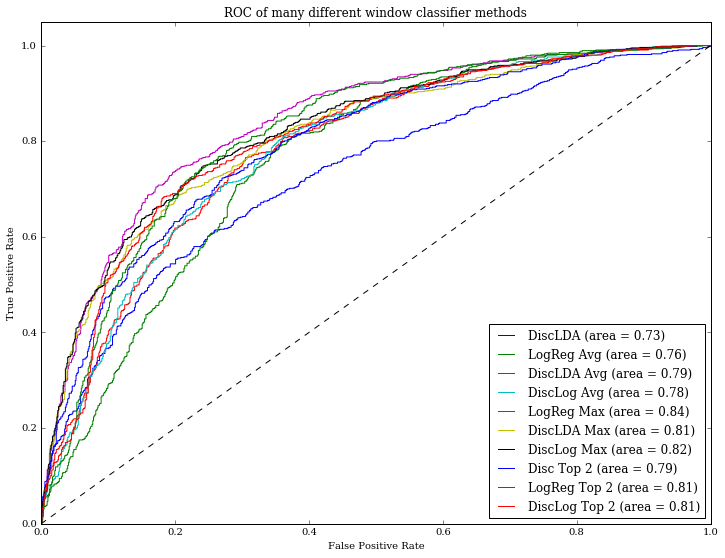

In [820]:
plt.figure(figsize=(12,9))
plt.plot(dlfpr, dltpr, label='DiscLDA (area = %0.2f)' % dls)
plt.plot(lrfpr, lrtpr, label='LogReg Avg (area = %0.2f)'% lrs)
plt.plot(dafpr, datpr, label='DiscLDA Avg (area = %0.2f)'% das)
plt.plot(dlrfpr, dlrtpr, label='DiscLog Avg (area = %0.2f)'% dlrs)

plt.plot(lmfpr, lmtpr, label='LogReg Max (area = %0.2f)'% lms)
plt.plot(dmfpr, dmtpr, label='DiscLDA Max (area = %0.2f)'% dms)
# plt.plot(dmsfpr, dmstpr, label='Disc Max S (area = %0.2f)'% dmss)
plt.plot(dlrmfpr, dlrmtpr, label='DiscLog Max (area = %0.2f)'% dlrms)

plt.plot(dskfpr, dsktpr, label='Disc Top %i (area = %0.2f)'% (k,dsk))
plt.plot(lrkfpr, lrktpr, label='LogReg Top %i (area = %0.2f)'% (k,lrk))
plt.plot(dlrkfpr, dlrktpr, label='DiscLog Top %i (area = %0.2f)'% (k,dlrk))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC of many different window classifier methods')
plt.legend(loc="lower right")

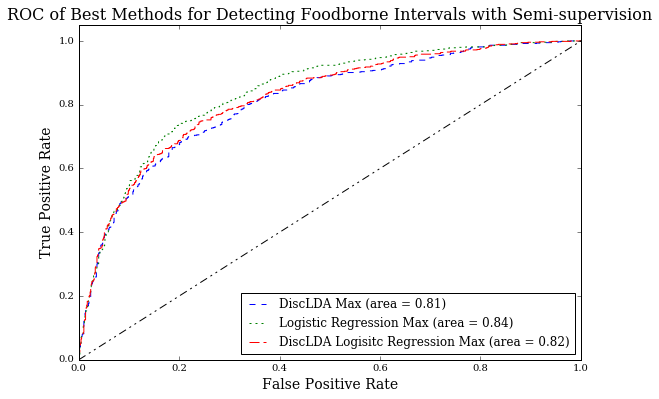

In [843]:
# save the best
plt.figure(figsize=(9,6))
# plt.plot(dlfpr, dltpr, label='DiscLDA (area = %0.2f)' % dls)
# plt.plot(lrfpr, lrtpr, label='LogReg Avg (area = %0.2f)'% lrs)
# plt.plot(dafpr, datpr, label='DiscLDA Avg (area = %0.2f)'% das)
# plt.plot(dlrfpr, dlrtpr, label='DiscLog Avg (area = %0.2f)'% dlrs)

plt.plot(dmfpr, dmtpr,'b--', label='DiscLDA Max (area = %0.2f)'% dms)
plt.plot(lmfpr, lmtpr, 'g-', dashes=[2,4], label='Logistic Regression Max (area = %0.2f)'% lms)
# plt.plot(dmsfpr, dmstpr, label='Disc Max S (area = %0.2f)'% dmss)
plt.plot(dlrmfpr, dlrmtpr, 'r-', dashes=[10,4], label='DiscLDA Logisitc Regression Max (area = %0.2f)'% dlrms)

# plt.plot(dskfpr, dsktpr, label='Disc K (area = %0.2f)'% dsk)
# plt.plot(lrkfpr, lrktpr, label='LogReg K (area = %0.2f)'% lrk)
# plt.plot(dlrkfpr, dlrktpr, label='DiscLog K (area = %0.2f)'% dlrk)

plt.plot([0, 1], [0, 1],  'k-', dashes=[8, 4, 2, 4, 2, 4])
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title("ROC of Best Methods for Detecting Foodborne Intervals with Semi-supervision", fontsize=16)
plt.legend(loc="lower right")

plt.savefig("semisup_windows_best_roc.png")

In [ ]:
# window lengths
lens = [ len(w['window']) for w in windows_test]

In [ ]:
plt.hist(lens, 100)

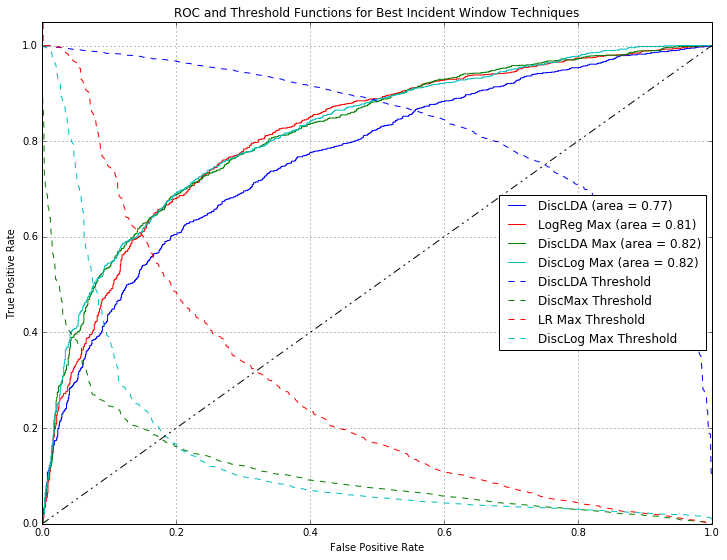

In [372]:
plt.figure(figsize=(12,9))
plt.plot(dlfpr, dltpr, 'b',label='DiscLDA (area = %0.2f)' % dls)
# plt.plot(lrfpr, lrtpr, label='LogReg (area = %0.2f)'% lrs)
# plt.plot(dafpr, datpr, label='DiscLDA Avg (area = %0.2f)'% das)
plt.plot(lmfpr, lmtpr, 'r', label='LogReg Max (area = %0.2f)'% lms)
plt.plot(dmfpr, dmtpr, 'g', label='DiscLDA Max (area = %0.2f)'% dms)
plt.plot(dlrmfpr, dlrmtpr, 'c', label='DiscLog Max (area = %0.2f)'% dlrms)
plt.plot(np.linspace(0,1, len(dlthresh)),dlthresh, 'b--', label="DiscLDA Threshold")
plt.plot(np.linspace(0,1, len(dmthresh)),dmthresh, 'g--',label="DiscMax Threshold")
plt.plot(np.linspace(0,1, len(lmthresh)),lmthresh, 'r--',label="LR Max Threshold")
plt.plot(np.linspace(0,1, len(dlrmthresh)),dlrmthresh, 'c--',label="DiscLog Max Threshold")

plt.plot([0, 1], [0, 1],  'k-', dashes=[8, 4, 2, 4, 2, 4])
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC and Threshold Functions for Best Incident Window Techniques')
plt.grid()
plt.legend(loc="right")

### Get most important topics from DiscLDA Logistic Regression:

In [373]:
for i, c in enumerate(dlr.coef_[0]):
    print i+1, c

1 0.473091122499
2 13.4560978808
3 -1.760261156
4 1.35887230807
5 -0.0030317725817
6 -0.752033436809
7 -2.11651583012
8 -1.14405445197
9 -0.241944559951
10 -0.706263309743
11 -1.63245330364
12 -0.36344553921
13 -0.217042409192
14 -1.65371104391
15 -0.645745143509
16 -2.4303909671
17 -0.488206596579
18 0.376958884674
19 -1.14560509229
20 1.93186103555
21 1.11419255784
22 -0.907565513333
23 -2.32651134322
24 0.930783028327
25 -0.262327825395
26 -1.45657674768
27 -2.063669315
28 -0.417318547231
29 0.282567649747
30 -1.10163982009


In [275]:
def print_windows(windows, k=100):
    for window in windows:
        win = window['window']
        etas, lrs, dlrs= window['etas'], window['lrs'], window['dlrs']
        lgs, dls, dlr = window['logreg_max'], window['disclda_max'], window['dlr_max']
        print '%r: %r: DLR: %.2f LR: %.2f DL: %.2f' % (bool(window['label']) ,window['biz'], dlr, lgs, dls)
        for i, w in enumerate(win):
            print '\t%i:: DLR: %.2f LR: %.2f DL: %.2f' % (i, dlrs[i], lrs[i], etas[i])
            print '\t%r' % w.text
            if i >= k: break
        print '#'*50

In [263]:
discsort = sorted(windows_test, key=lambda x:x['disclda_max'], reverse=True)

In [264]:
print_windows(discsort, k=50)

True: u'El Toro Mexican Grill': DLR: 1.00 LR: 0.92 DL: 0.98
	0:: DLR: 1.00 LR: 0.92 DL: 0.98
	u'The fish I ate there gave me food poisoning. Had bad stomach pain since yesterday, and diarrhea.'
##################################################
True: u'Patacon Pisao': DLR: 1.00 LR: 0.49 DL: 0.96
	0:: DLR: 0.00 LR: 0.00 DL: 0.00
	u"It's a small place with a few tables for sitting.  The service was really friendly, and everything on the menu looked great and was reasonably priced!  \n\nI tried their patacon paisa, and it was pretty good.  They have a good sizes portions.  The special sauces they had made it even better!  And their tres leches cake was not too sweet, and was satisfying.  I would definitely go back to try more things!"
	1:: DLR: 1.00 LR: 0.49 DL: 0.96
	u'I got sick after eating here.'
	2:: DLR: 0.03 LR: 0.01 DL: 0.00
	u"This place is good. I came here after reading a yelp review a few years ago as it's fairly near the mall and Target. I'd never had this kind of sandwich be

## Learn Best LogReg and DiscLDA

In [493]:
from sklearn import cross_validation
folds = cross_validation.StratifiedKFold(data['y'], n_folds=3, random_state=0, shuffle=True)

5
Running LDA with 5 topics and 1000 iterations...
(N,V):  (667, 3115)

Running LDA with 5 topics and 1000 iterations...
(N,V):  (667, 2995)

Running LDA with 5 topics and 1000 iterations...
(N,V):  (668, 3050)

AUC: 0.82
Running LDA with 5 topics and 1000 iterations...
(N,V):  (1001, 3915)

6
Running LDA with 6 topics and 1000 iterations...
(N,V):  (667, 3115)

Running LDA with 6 topics and 1000 iterations...
(N,V):  (667, 2995)

Running LDA with 6 topics and 1000 iterations...
(N,V):  (668, 3050)

AUC: 0.82
Running LDA with 6 topics and 1000 iterations...
(N,V):  (1001, 3915)

7
Running LDA with 7 topics and 1000 iterations...
(N,V):  (667, 3115)

Running LDA with 7 topics and 1000 iterations...
(N,V):  (667, 2995)

Running LDA with 7 topics and 1000 iterations...
(N,V):  (668, 3050)

AUC: 0.82
Running LDA with 7 topics and 1000 iterations...
(N,V):  (1001, 3915)

8
Running LDA with 8 topics and 1000 iterations...
(N,V):  (667, 3115)

Running LDA with 8 topics and 1000 iterations...


0.01
AUC: 0.83
0.05
AUC: 0.84
0.1
AUC: 0.84
0.5
AUC: 0.83
1.0
AUC: 0.82
2.0
AUC: 0.82
CPU times: user 6.08 s, sys: 30.6 ms, total: 6.11 s
Wall time: 6.18 s
